<a href="https://colab.research.google.com/github/sachinthadilshann/TensorFlow_for_Deep_Learning_Bootcamp_Udemy/blob/main/06_transfer_learning_in_tensorflow_part_3_scaling_up.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
!wget https://raw.githubusercontent.com/sachinthadilshann/TensorFlow_for_Deep_Learning_Bootcamp_Udemy/15a269df7d105222999c850ce9fa956af7610972/helper_functions.py

--2025-07-05 06:15:55--  https://raw.githubusercontent.com/sachinthadilshann/TensorFlow_for_Deep_Learning_Bootcamp_Udemy/15a269df7d105222999c850ce9fa956af7610972/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5351 (5.2K) [text/plain]
Saving to: ‘helper_functions.py.2’

helper_functions.py 100%[===================>]   5.23K  --.-KB/s    in 0s      

2025-07-05 06:15:55 (62.8 MB/s) - ‘helper_functions.py.2’ saved [5351/5351]



In [6]:
from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, compare_historys, walk_through_dir

In [7]:
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip

unzip_data("101_food_classes_10_percent.zip")

--2025-07-05 06:15:55--  https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.210.207, 173.194.212.207, 108.177.12.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.210.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1625420029 (1.5G) [application/zip]
Saving to: ‘101_food_classes_10_percent.zip.2’

101_food_classes_10 100%[===================>]   1.51G   232MB/s    in 12s     

2025-07-05 06:16:07 (129 MB/s) - ‘101_food_classes_10_percent.zip.2’ saved [1625420029/1625420029]



In [8]:
unzip_data("101_food_classes_10_percent.zip")

In [9]:
test_dir = '/content/101_food_classes_10_percent/test'
train_dir = '/content/101_food_classes_10_percent/train'

In [10]:
walk_through_dir("101_food_classes_10_percent")

There are 2 directories and 0 images in '101_food_classes_10_percent'.
There are 101 directories and 0 images in '101_food_classes_10_percent/train'.
There are 0 directories and 75 images in '101_food_classes_10_percent/train/panna_cotta'.
There are 0 directories and 75 images in '101_food_classes_10_percent/train/ramen'.
There are 0 directories and 75 images in '101_food_classes_10_percent/train/nachos'.
There are 0 directories and 75 images in '101_food_classes_10_percent/train/pancakes'.
There are 0 directories and 75 images in '101_food_classes_10_percent/train/paella'.
There are 0 directories and 75 images in '101_food_classes_10_percent/train/deviled_eggs'.
There are 0 directories and 75 images in '101_food_classes_10_percent/train/peking_duck'.
There are 0 directories and 75 images in '101_food_classes_10_percent/train/grilled_cheese_sandwich'.
There are 0 directories and 75 images in '101_food_classes_10_percent/train/bruschetta'.
There are 0 directories and 75 images in '101_f

In [11]:
import tensorflow as tf

IMG_SIZE = (224, 224)


train_data_all_10_percent = tf.keras.preprocessing.image_dataset_from_directory(train_dir,
                                                                                label_mode ="categorical",
                                                                                image_size = IMG_SIZE)

test_data = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                                label_mode ="categorical",
                                                                image_size = IMG_SIZE,
                                                                shuffle = False)

Found 7575 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


In [12]:
train_data_all_10_percent.class_names

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [13]:
checkpoint_path  = '/content/101_food_classes_10_percent_data_model_checkpoint.weights.h5'

checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                         save_weights_only=True,
                                                         monitor='val_accuracy',
                                                         save_best_only=True)

In [14]:
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [15]:
data_augmentation = Sequential([
  layers.RandomFlip("horizontal"),
  layers.RandomRotation(0.2),
  layers.RandomZoom(0.2),
  layers.RandomHeight(0.2),
  layers.RandomWidth(0.2),
], name ="data_augmentation")

In [16]:
base_model  = tf.keras.applications.efficientnet.EfficientNetB0(include_top=False)
base_model.trainable = False

inputs = layers.Input(shape=(224,224,3),name='input_layer')

x = data_augmentation(inputs)
x = base_model(x,training=False)
x = layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)

outputs = layers.Dense(101,activation='softmax',name='output_layer')(x)

model = tf.keras.Model(inputs,outputs)




In [17]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, None, None,     │     4,049,571 │
│                                 │ 1280)                  │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling_layer    │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 101)            │       129,381 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,178,952 (15.94 MB)

 Trainable params: 129,381 (505.39 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [18]:
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(),
              metrics=['accuracy'])

history_all_classes_10_percent = model.fit(train_data_all_10_percent,
                                           epochs=5,
                                           validation_data = test_data,
                                           validation_steps = int(0.15*len(test_data)),
                                           callbacks = [checkpoint_callback])

Epoch 1/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 56s 173ms/step - accuracy: 0.1549 - loss: 3.9592 - val_accuracy: 0.4288 - val_loss: 2.5761
Epoch 2/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 82s 185ms/step - accuracy: 0.4738 - loss: 2.3464 - val_accuracy: 0.5130 - val_loss: 2.0634
Epoch 3/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 41s 173ms/step - accuracy: 0.5474 - loss: 1.9177 - val_accuracy: 0.5307 - val_loss: 1.8963
Epoch 4/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 40s 171ms/step - accuracy: 0.5939 - loss: 1.6905 - val_accuracy: 0.5307 - val_loss: 1.8375
Epoch 5/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - accuracy: 0.6182 - loss: 1.5474 - val_accuracy: 0.5376 - val_loss: 1.7602


In [19]:
fine_tuining_result = model.evaluate(test_data)

790/790 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.5574 - loss: 1.6818


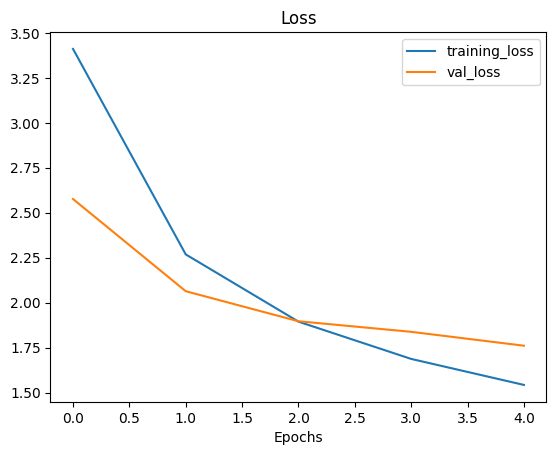

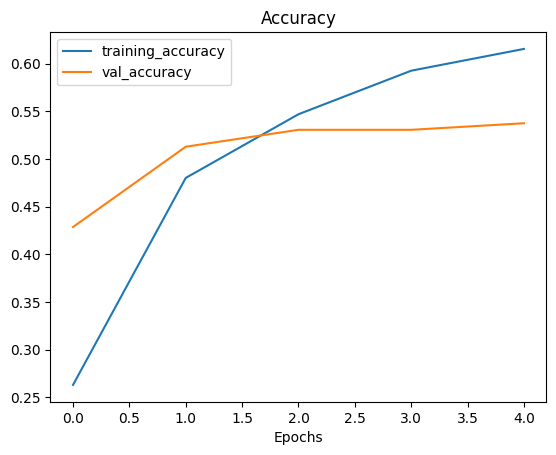

In [20]:
plot_loss_curves(history_all_classes_10_percent)

In [21]:
base_model.trainable = True    #unfreeze the all layers

for layer in base_model.layers[:-5 ]: #refreez the lases 5
  layers.trainable = False


In [22]:
model.compile(loss="categorical_crossentropy",
              optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001),
              metrics = ['accuracy']) #recompile the model for low lr


In [23]:
for layer in model.layers:
  print(layer.name,layer.trainable)

input_layer True
data_augmentation True
efficientnetb0 True
global_average_pooling_layer True
output_layer True


In [24]:
for layer_number, layer in enumerate(base_model.layers):
  print(layer_number, layer.name, layer.trainable)

0 input_layer True
1 rescaling True
2 normalization True
3 rescaling_1 True
4 stem_conv_pad True
5 stem_conv True
6 stem_bn True
7 stem_activation True
8 block1a_dwconv True
9 block1a_bn True
10 block1a_activation True
11 block1a_se_squeeze True
12 block1a_se_reshape True
13 block1a_se_reduce True
14 block1a_se_expand True
15 block1a_se_excite True
16 block1a_project_conv True
17 block1a_project_bn True
18 block2a_expand_conv True
19 block2a_expand_bn True
20 block2a_expand_activation True
21 block2a_dwconv_pad True
22 block2a_dwconv True
23 block2a_bn True
24 block2a_activation True
25 block2a_se_squeeze True
26 block2a_se_reshape True
27 block2a_se_reduce True
28 block2a_se_expand True
29 block2a_se_excite True
30 block2a_project_conv True
31 block2a_project_bn True
32 block2b_expand_conv True
33 block2b_expand_bn True
34 block2b_expand_activation True
35 block2b_dwconv True
36 block2b_bn True
37 block2b_activation True
38 block2b_se_squeeze True
39 block2b_se_reshape True
40 block2b

In [25]:
fine_tune_epochs = 10 # model has already done 5 epochs, (5+5=10)

#fine tne the model

history_all_classes_10_percent_fine_tune = model.fit(train_data_all_10_percent,
                                                     epochs=fine_tune_epochs,
                                                     validation_data=test_data,
                                                     validation_steps=int(0.15 * len(test_data)),
                                                     initial_epoch=history_all_classes_10_percent.epoch[-1]) #start form previous epoch

Epoch 5/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 146s 442ms/step - accuracy: 0.3912 - loss: 2.5783 - val_accuracy: 0.4958 - val_loss: 1.9876
Epoch 6/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 142s 600ms/step - accuracy: 0.6109 - loss: 1.5372 - val_accuracy: 0.4775 - val_loss: 2.0357
Epoch 7/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 142s 599ms/step - accuracy: 0.6829 - loss: 1.2459 - val_accuracy: 0.4817 - val_loss: 2.0150
Epoch 8/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 142s 600ms/step - accuracy: 0.7265 - loss: 1.0676 - val_accuracy: 0.5053 - val_loss: 1.9098
Epoch 9/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 98s 414ms/step - accuracy: 0.7491 - loss: 0.9653 - val_accuracy: 0.5201 - val_loss: 1.8373
Epoch 10/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 142s 599ms/step - accuracy: 0.7887 - loss: 0.8233 - val_accuracy: 0.5328 - val_loss: 1.7961


In [26]:
results_all_classes_10_percent_fine_tune = model.evaluate(test_data)
results_all_classes_10_percent_fine_tune

790/790 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.5554 - loss: 1.7075


[1.6272426843643188, 0.5742574334144592]

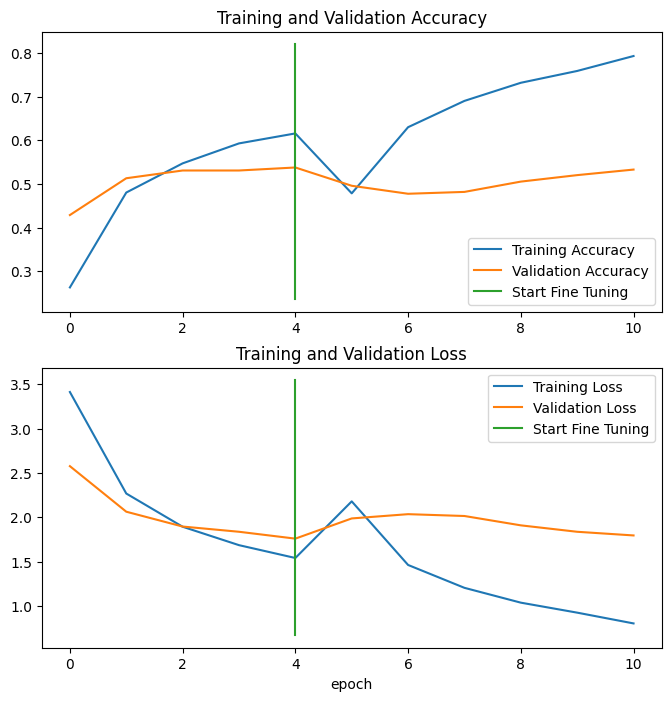

In [27]:
compare_historys(original_history=history_all_classes_10_percent,
                 new_history=history_all_classes_10_percent_fine_tune,
                 initial_epochs=5)

In [28]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [29]:
model.save("/content/drive/MyDrive/tensorflow_course/101_food_class_10_percent_saved_big_dog_model.keras")


In [30]:
loaded_model = tf.keras.models.load_model("/content/drive/MyDrive/tensorflow_course/101_food_class_10_percent_saved_big_dog_model.keras")

In [31]:
loaded_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, None, None,     │     4,049,571 │
│                                 │ 1280)                  │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling_layer    │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 101)            │       129,381 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,452,812 (47.50 MB)

 Trainable params: 4,136,929 (15.78 MB)

 Non-trainable params: 42,023 (164.16 KB)

 Optimizer params: 8,273,860 (31.56 MB)

In [32]:
loaeded_model_results = loaded_model.evaluate(test_data)
loaeded_model_results

790/790 ━━━━━━━━━━━━━━━━━━━━ 64s 74ms/step - accuracy: 0.5554 - loss: 1.7075


[1.6272426843643188, 0.5742574334144592]

In [33]:
results_all_classes_10_percent_fine_tune


[1.6272426843643188, 0.5742574334144592]

In [34]:
preds_probs = model.predict(test_data,verbose=1)

790/790 ━━━━━━━━━━━━━━━━━━━━ 64s 78ms/step


In [35]:
len(test_data)

790

In [36]:
 len(preds_probs)

25250

In [37]:
preds_probs[:5]

array([[2.23689750e-01, 2.47494696e-04, 3.19844251e-03, 3.21339439e-06,
        1.16380215e-04, 2.13217281e-05, 4.16906580e-04, 7.29806197e-06,
        1.83501635e-02, 5.70503798e-05, 2.68886060e-06, 3.75195843e-04,
        1.74374750e-03, 8.72833334e-06, 1.56918777e-05, 1.03809603e-03,
        7.21416873e-05, 3.74957817e-05, 8.76910705e-03, 1.25654560e-05,
        2.21641758e-03, 2.59508204e-04, 1.64536852e-03, 2.18557101e-03,
        2.19951244e-03, 5.53616614e-04, 2.32939562e-03, 3.43516695e-05,
        3.82041006e-04, 3.17085214e-04, 1.50709343e-06, 5.55904862e-03,
        1.05330197e-03, 7.93679646e-05, 1.90112717e-03, 2.14003212e-05,
        9.48567758e-05, 3.71851726e-04, 8.52226242e-02, 4.22718964e-04,
        3.33503151e-04, 2.46800925e-03, 3.95199098e-03, 6.52536328e-05,
        1.03246981e-04, 2.21140654e-04, 3.08581511e-03, 7.44445642e-05,
        2.78507887e-05, 3.50032165e-03, 5.75885992e-04, 1.56693649e-03,
        9.55885835e-03, 1.42272413e-02, 2.76845810e-03, 9.091212

In [40]:
print(f'Number of prediction probabilities for sample 0: {len(preds_probs[0])}')
print()
print(f'What prediction probability sample 0 has: {preds_probs[0]}')
print()
print(f"The class with the highest predicted probability by the model for sample 0: {preds_probs[0].argmax()}")


Number of prediction probabilities for sample 0: 101

What prediction probability sample 0 has: [2.23689750e-01 2.47494696e-04 3.19844251e-03 3.21339439e-06
 1.16380215e-04 2.13217281e-05 4.16906580e-04 7.29806197e-06
 1.83501635e-02 5.70503798e-05 2.68886060e-06 3.75195843e-04
 1.74374750e-03 8.72833334e-06 1.56918777e-05 1.03809603e-03
 7.21416873e-05 3.74957817e-05 8.76910705e-03 1.25654560e-05
 2.21641758e-03 2.59508204e-04 1.64536852e-03 2.18557101e-03
 2.19951244e-03 5.53616614e-04 2.32939562e-03 3.43516695e-05
 3.82041006e-04 3.17085214e-04 1.50709343e-06 5.55904862e-03
 1.05330197e-03 7.93679646e-05 1.90112717e-03 2.14003212e-05
 9.48567758e-05 3.71851726e-04 8.52226242e-02 4.22718964e-04
 3.33503151e-04 2.46800925e-03 3.95199098e-03 6.52536328e-05
 1.03246981e-04 2.21140654e-04 3.08581511e-03 7.44445642e-05
 2.78507887e-05 3.50032165e-03 5.75885992e-04 1.56693649e-03
 9.55885835e-03 1.42272413e-02 2.76845810e-03 9.09121241e-04
 1.64140412e-03 7.06901657e-04 1.05200708e-02 2.89

In [41]:
pred_classes = preds_probs.argmax(axis=1)
pred_classes[:10]

array([85,  0,  0, 72,  0, 78, 98, 98, 85, 72])

In [42]:
test_data

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 101), dtype=tf.float32, name=None))>

In [43]:
y_labels = []

for images, labels in test_data.unbatch():
  y_labels.append(labels.numpy().argmax())

In [44]:
y_labels[:10]

[np.int64(0),
 np.int64(0),
 np.int64(0),
 np.int64(0),
 np.int64(0),
 np.int64(0),
 np.int64(0),
 np.int64(0),
 np.int64(0),
 np.int64(0)]

In [45]:
len(y_labels)

25250

In [46]:
from sklearn.metrics import accuracy_score

In [47]:
accuracy_score = accuracy_score(y_labels,pred_classes)
accuracy_score

0.5742574257425742

In [54]:
class_names = test_data.class_names
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']

In [55]:
from helper_functions import make_confusion_matrix

make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes,
                      classes=train_data_all_10_percent.class_names,
                      figsize = (100,100),
                      text_size=20,
                      savefig=True)

In [49]:
from sklearn.metrics import classification_report

print(classification_report(y_labels,pred_classes))

              precision    recall  f1-score   support

           0       0.23      0.14      0.17       250
           1       0.80      0.49      0.61       250
           2       0.62      0.68      0.65       250
           3       0.52      0.72      0.60       250
           4       0.51      0.52      0.51       250
           5       0.39      0.48      0.43       250
           6       0.48      0.83      0.60       250
           7       0.95      0.70      0.81       250
           8       0.32      0.43      0.37       250
           9       0.69      0.36      0.47       250
          10       0.66      0.34      0.45       250
          11       0.51      0.74      0.60       250
          12       0.57      0.67      0.62       250
          13       0.65      0.50      0.57       250
          14       0.69      0.43      0.53       250
          15       0.44      0.30      0.36       250
          16       0.46      0.62      0.53       250
          17       0.39    

In [50]:
classification_report_dict = classification_report(y_labels,pred_classes,output_dict=True)

In [59]:
f1_score = {}


for key, value in classification_report_dict.items():
  if key == "accuracy":
    break
  else:
      f1_score[class_names[int(key)] ]= value["f1-score"]

f1_score

{'apple_pie': 0.1745635910224439,
 'baby_back_ribs': 0.6054590570719603,
 'baklava': 0.6513409961685823,
 'beef_carpaccio': 0.6047297297297297,
 'beef_tartare': 0.5138339920948617,
 'beet_salad': 0.42907801418439717,
 'beignets': 0.6043795620437956,
 'bibimbap': 0.8091954022988506,
 'bread_pudding': 0.36769759450171824,
 'breakfast_burrito': 0.47244094488188976,
 'bruschetta': 0.45144356955380577,
 'caesar_salad': 0.5993485342019544,
 'cannoli': 0.6151012891344383,
 'caprese_salad': 0.5668934240362812,
 'carrot_cake': 0.528395061728395,
 'ceviche': 0.36104513064133015,
 'cheese_plate': 0.5299145299145299,
 'cheesecake': 0.4329159212880143,
 'chicken_curry': 0.47337278106508873,
 'chicken_quesadilla': 0.6082474226804123,
 'chicken_wings': 0.6841046277665996,
 'chocolate_cake': 0.3955119214586255,
 'chocolate_mousse': 0.34594594594594597,
 'churros': 0.5563282336578581,
 'clam_chowder': 0.6736842105263158,
 'club_sandwich': 0.6549019607843137,
 'crab_cakes': 0.4909456740442656,
 'creme_b

In [60]:
import pandas as pd

f1_score_df = pd.DataFrame(data=f1_score,index=[0])
f1_score_df

,apple_pie,baby_back_ribs,baklava,beef_carpaccio,beef_tartare,beet_salad,beignets,bibimbap,bread_pudding,breakfast_burrito,...,spaghetti_carbonara,spring_rolls,steak,strawberry_shortcake,sushi,tacos,takoyaki,tiramisu,tuna_tartare,waffles
0,0.174564,0.605459,0.651341,0.60473,0.513834,0.429078,0.60438,0.809195,0.367698,0.472441,...,0.810458,0.640152,0.306998,0.579186,0.662447,0.305389,0.628676,0.375776,0.389408,0.631579


In [63]:
f1_scores = pd.DataFrame({"class_name": list(class_f1_scores.keys()),
                          "f1-score": list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)
f1_scores.head(10)

,class_name,f1-score
33,edamame,0.920455
63,macarons,0.872093
91,spaghetti_carbonara,0.810458
7,bibimbap,0.809195
69,oysters,0.807921
88,seaweed_salad,0.801572
32,dumplings,0.791667
64,miso_soup,0.789474
54,hot_and_sour_soup,0.786765
75,pho,0.779130


In [64]:
f1_scores.tail(10)

,class_name,f1-score
87,scallops,0.355890
22,chocolate_mousse,0.345946
77,pork_chop,0.328063
93,steak,0.306998
96,tacos,0.305389
82,ravioli,0.296378
39,foie_gras,0.280000
56,huevos_rancheros,0.231023
89,shrimp_and_grits,0.214286
0,apple_pie,0.174564


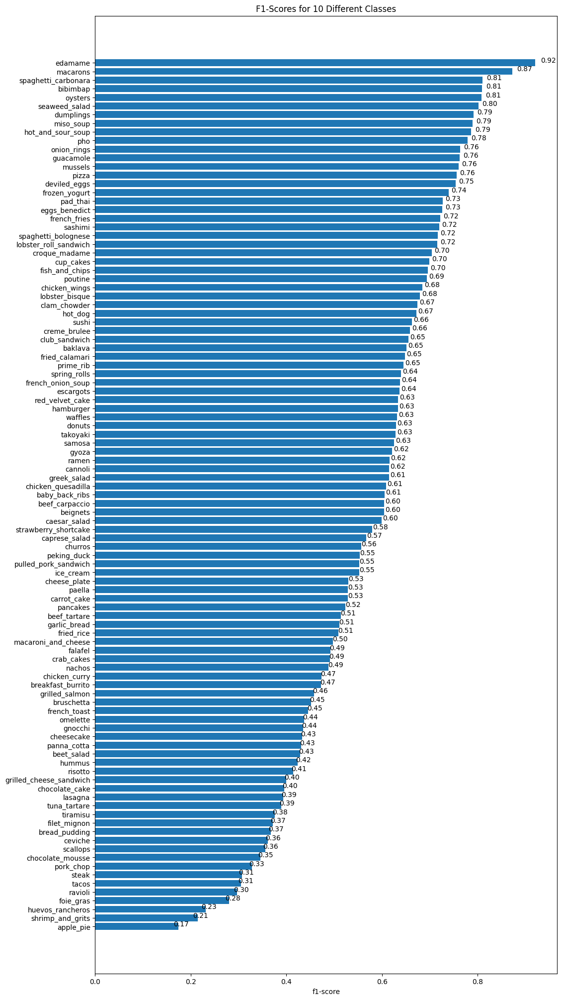

In [75]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 25))
scores = ax.barh(range(len(f1_scores)), f1_scores["f1-score"].values)
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(list(f1_scores["class_name"]))
ax.set_xlabel("f1-score")
ax.set_title("F1-Scores for 10 Different Classes")
ax.invert_yaxis();

def autolabel(rects):

    for rect in rects:
        width = rect.get_width()
        ax.text(1.03*width, rect.get_y() + rect.get_height()/1.5,
        f"{width:.2f}",
        ha='center', va='bottom')



autolabel(scores)

plt.show()


In [76]:
def load_and_prep_image(filename,img_shape=224,scale=True):
  img = tf.io.read_file(filename)
  img = tf.image.decode_image(img,channels=3) #decode image into tensor
  img = tf.image.resize(img,size=[img_shape,img_shape])
  if scale:
    return img/255.
  else:
    return img


In [77]:
%load_ext tensorboard
%tensorboard --logdir ./transfer_learning

<IPython.core.display.Javascript object>